Importing the libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd
import scipy.stats as st
import statistics as stat

Plotting all the RV's

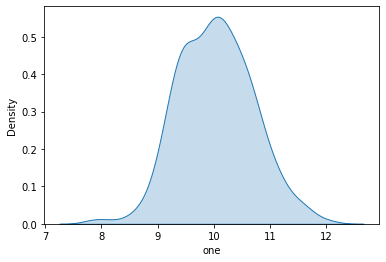

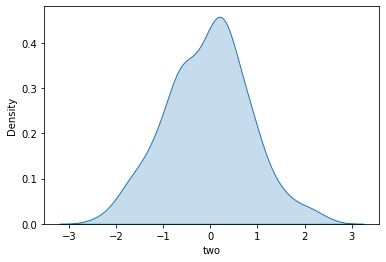

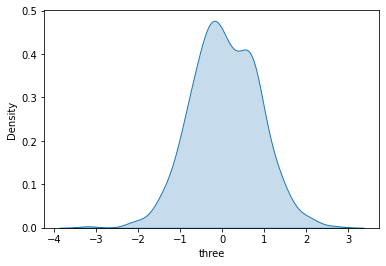

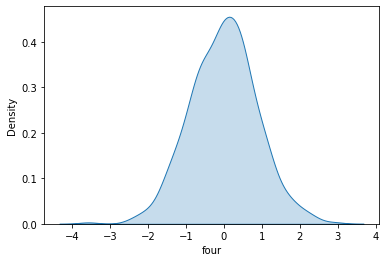

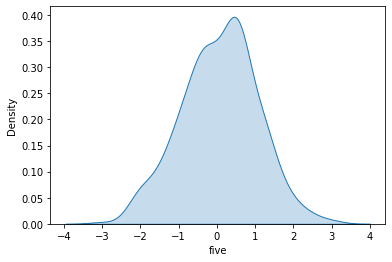

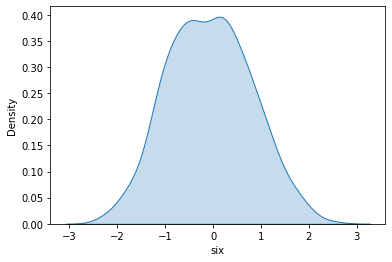

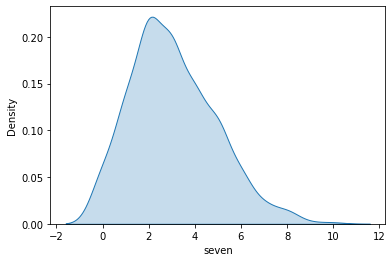

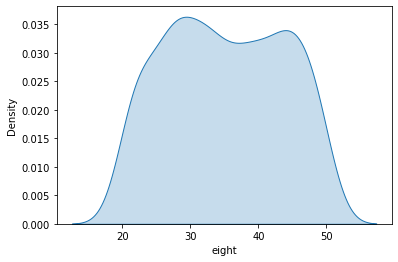

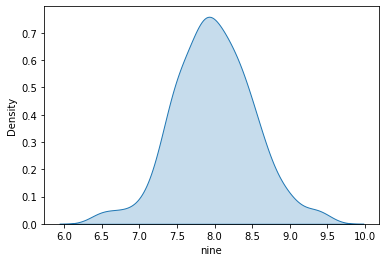

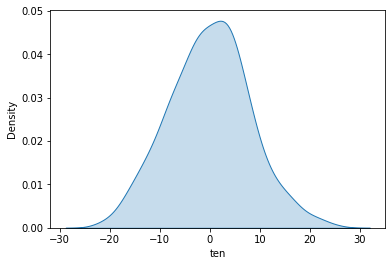

In [ ]:
data=pd.read_csv('dataset.csv')
col=['index','one','two','three','four','five','six','seven','eight','nine','ten']

for i in range(1,11):
  sb.kdeplot(data[col[i]],fill=True)
  plt.show()

Plotting the joint distribution of all possible pairs

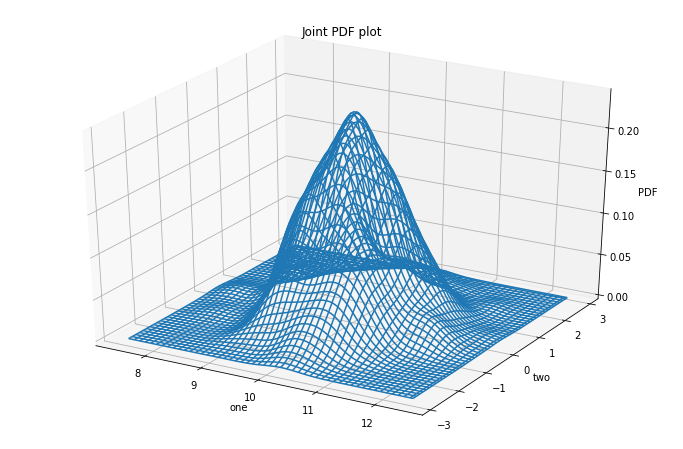

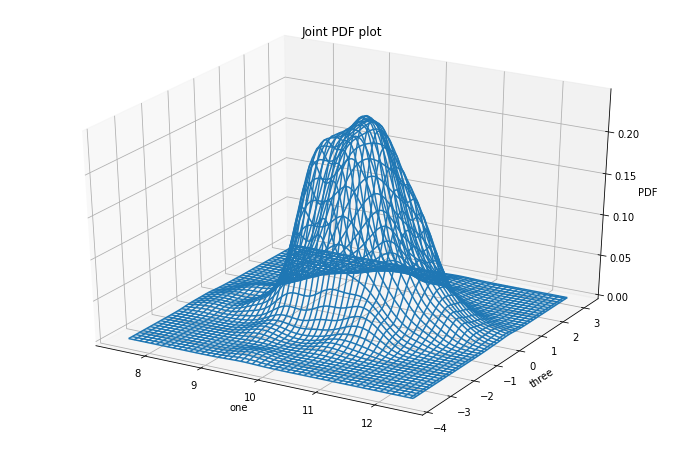

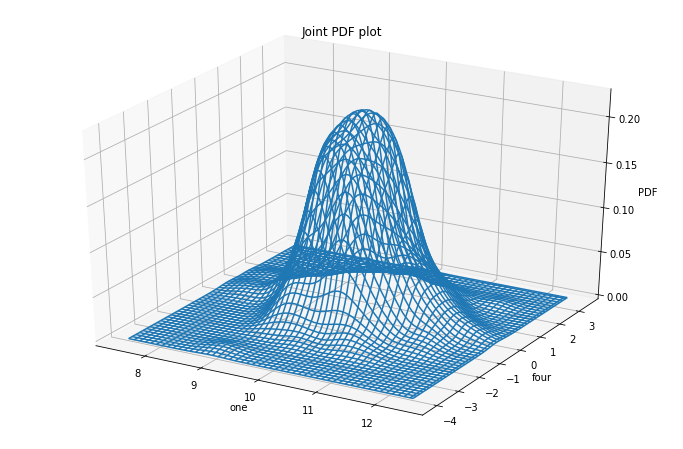

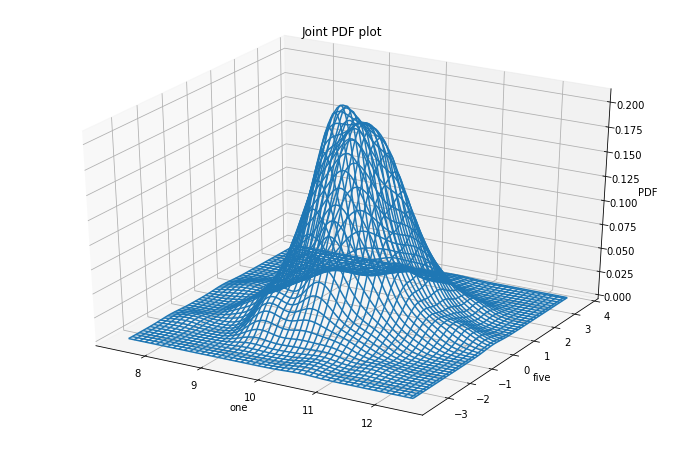

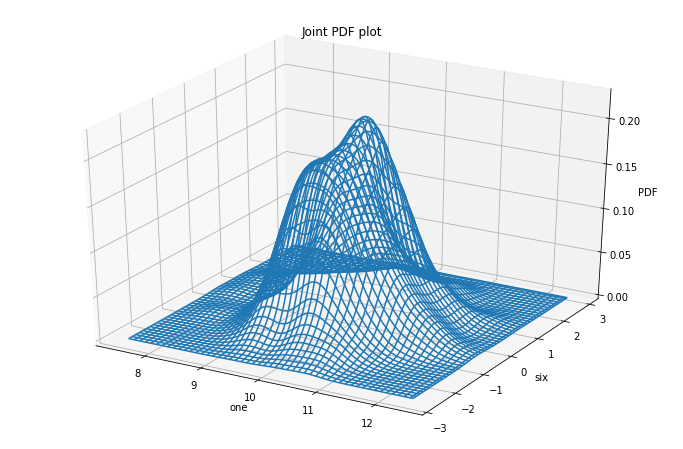

...

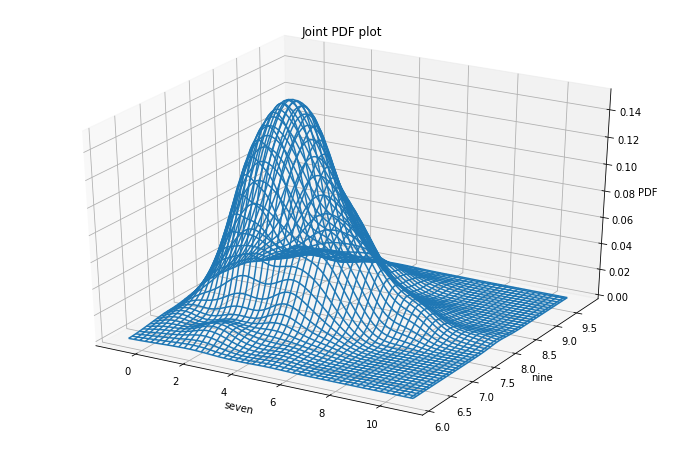

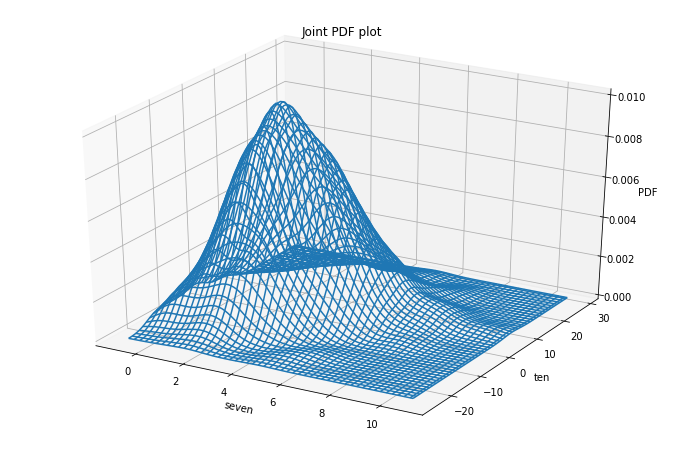

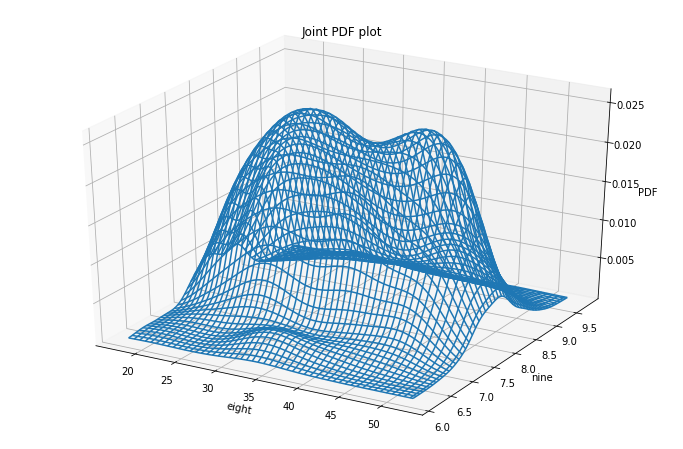

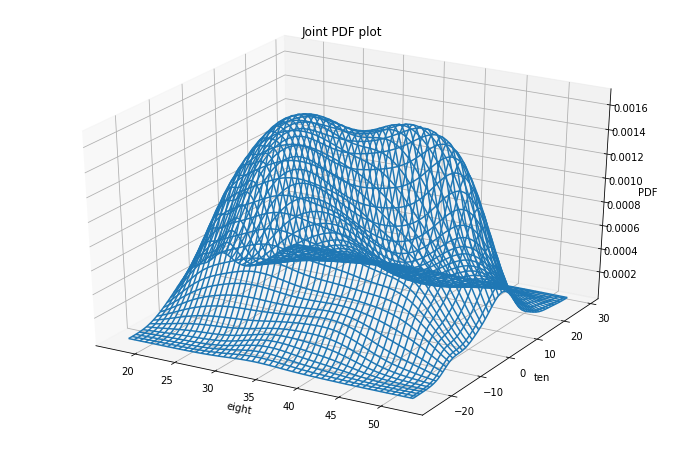

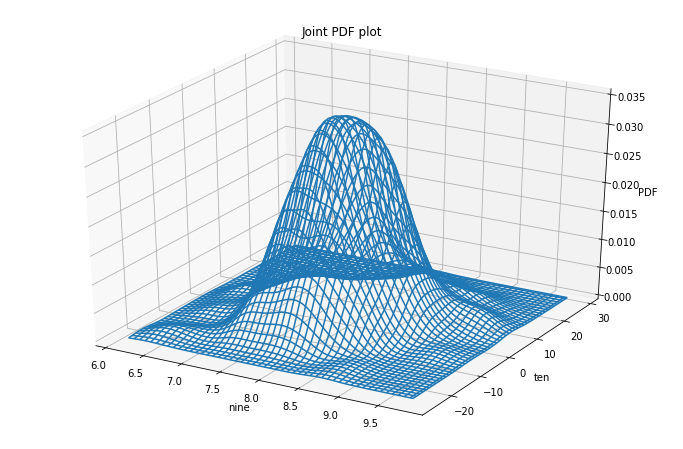

In [ ]:
for i in range(1,11):
  for j in range(i+1,11):
    x = data[col[i]]
    y = data[col[j]]

    dx = (max(x)-min(x))/12
    dy = (max(y)-min(y))/12
    xmin = min(x) - dx
    xmax = max(x) + dx
    ymin = min(y) - dy
    ymax = max(y) + dy

    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    positions = np.vstack([xx.ravel(), yy.ravel()])
    values = np.vstack([x, y])
    kernel = st.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx.shape)

    fig = plt.figure(figsize=(12,8))
    ax = plt.axes(projection='3d')
    w = ax.plot_wireframe(xx, yy, f)
    ax.set_xlabel(col[i])
    ax.set_ylabel(col[j])
    ax.set_zlabel('PDF')
    ax.set_title('Joint PDF plot');
    plt.show()


Plotting the correlation matrix


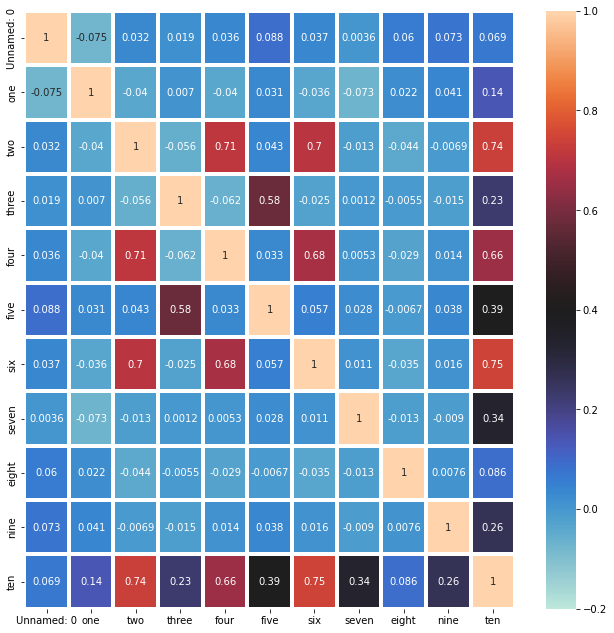

In [ ]:
fig, ax = plt.subplots(figsize=(11,11))
corr = sb.heatmap(data.corr(), annot=True,linewidths=3,center = 0.4,vmax=1,vmin=-0.2)

Plotting the correlation between all variables

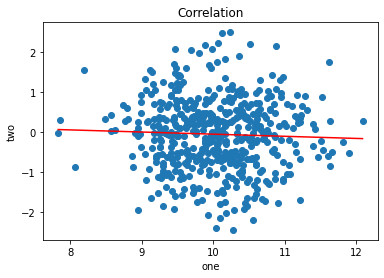

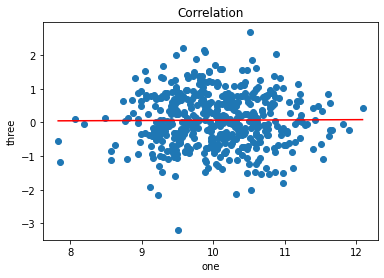

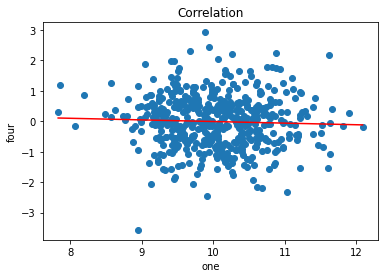

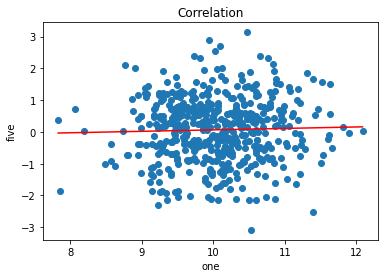

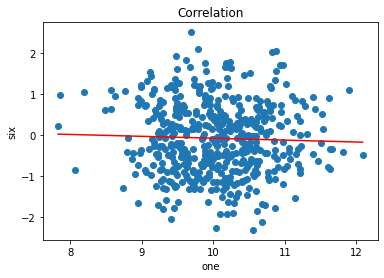

...

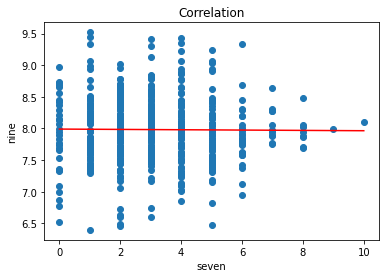

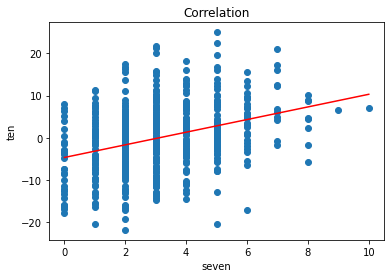

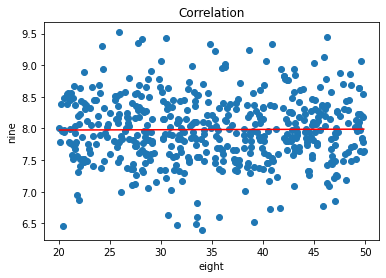

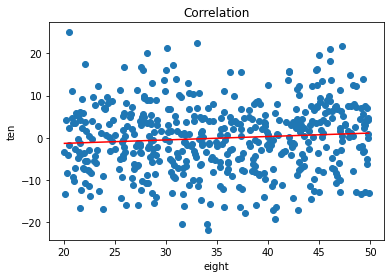

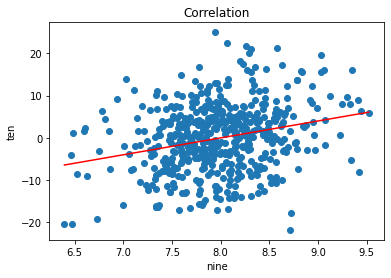

In [ ]:
for i in range(1,11):
  for j in range(i+1,11):
    x = data[col[i]]
    y = data[col[j]]
    plt.title('Correlation')
    plt.scatter(x,y)

    plt.plot(np.unique(x),
    np.poly1d(np.polyfit(x, y, 1))
    (np.unique(x)), color='red')

    plt.xlabel(col[i])
    plt.ylabel(col[j])

    plt.show()

Finding the SD, mean of all RV's, applying Chebyshev's inequality (with k = 2, according to the inequality, the probability should be < 1/4 = 0.25)


In [ ]:
sd = [-50]  #initialising 1 value randomly for the index
mu = [-50]
k = 2
for i in range(1,11):
  sd.append(stat.stdev(data[col[i]]))
  mu.append(stat.mean(data[col[i]]))

for i in range(1,11):
  count = 0
  for j in range(len(data[col[i]])):
    x = data[col[i]][j]
    if ((x - mu[i]) >= k*sd[i]) or ((mu[i]-x) >= k*sd[i]):
      count = count + 1
  print("Probability that RV {x:} is further than 2*SD from mean is: ".format(x = col[i]))
  print(count/len(data[col[i]]))


Probability that RV one is further than 2*SD from mean is: 
0.046
Probability that RV two is further than 2*SD from mean is: 
0.052
Probability that RV three is further than 2*SD from mean is: 
0.038
Probability that RV four is further than 2*SD from mean is: 
0.046
Probability that RV five is further than 2*SD from mean is: 
0.048
Probability that RV six is further than 2*SD from mean is: 
0.038
Probability that RV seven is further than 2*SD from mean is: 
0.042
Probability that RV eight is further than 2*SD from mean is: 
0.0
Probability that RV nine is further than 2*SD from mean is: 
0.056
Probability that RV ten is further than 2*SD from mean is: 
0.046


Finding best guess of X given Y (E(X|Y))
(Over here, we're taking Y values only from column seven because it is integer values)

Enter the random variable to get expectation for: 8
Enter value of random variable seven (between 0 and 10) to get expectation for X: 3
Plot of P(eight|seven=3)


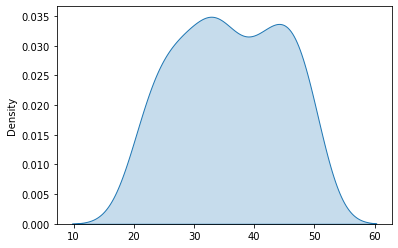

The expected value of RV eight for given value of RV seven(3) is: 35.894315629754885


In [ ]:
E = [] #Stores the values of X|Y
X = int(input("Enter the random variable to get expectation for: "))
# print(min(data[col[7]]),max(data[col[7]]))
Y = int(input("Enter value of random variable seven (between 0 and 10) to get expectation for X: "))

for i in range(len(data[col[7]])):
  if data[col[7]][i] == Y:
    E.append(data[col[X]][i])

print("Plot of P({0}|seven={1})".format(col[X],Y))
sb.kdeplot(E,fill=True)
plt.show()

prob = 1/len(E)
expec = 0
for i in range(len(E)):
  expec = expec + E[i]*prob

print("The expected value of RV {0} for given value of RV seven({1}) is: {2}".format(col[X],Y,expec))
